## Underfitting and Overfitting

#### Overfitting
오버피팅을 방지하는 방법
1. 데이터를 더 확보
2. 모델의 설명력을 줄리는 것, 즉, complexity를 감소시키는 것
3. 앙상블 기법 사용
4. Use skills

가장 좋은 방법은 데이터를 확보하는 것이다

#### Better Training
언더피팅을 방지하는 방법
- Use better optimizer
  - local optima에 빠지지 않도록

## weight_decay

#### Limiting the Capacity

- Architecture : 히든 레어이와 unit 레이어의 개수를 줄인다
- early stopping : 학습하다가 기대되는 성능이 나온다면, 학습을 중단시키는 방식
- Weight decay : 가중치에 벌점을 줘서 값을 줄이는 방식

#### Weight decay

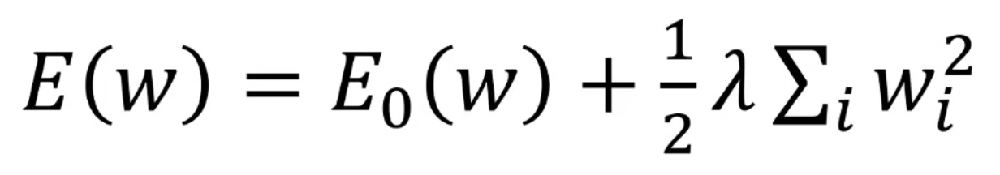

- 기존 back propagation에서 -a*가중치 미분 부분에 해당 식으로 대체하여 같이 미분을 해주는 것
- 기본적으로 가중치 값에 비례하기 때문에 값 자체가 바뀌거나 그러진 않는다!
- 업데이트 값이 람다에 의하여 작아지기 때문에 상쇄하는 효과가 생긴다
- weight decay = l2 penalty와 동일
- SGD에서도 weight decay 파라미터가 존재

## Dropout

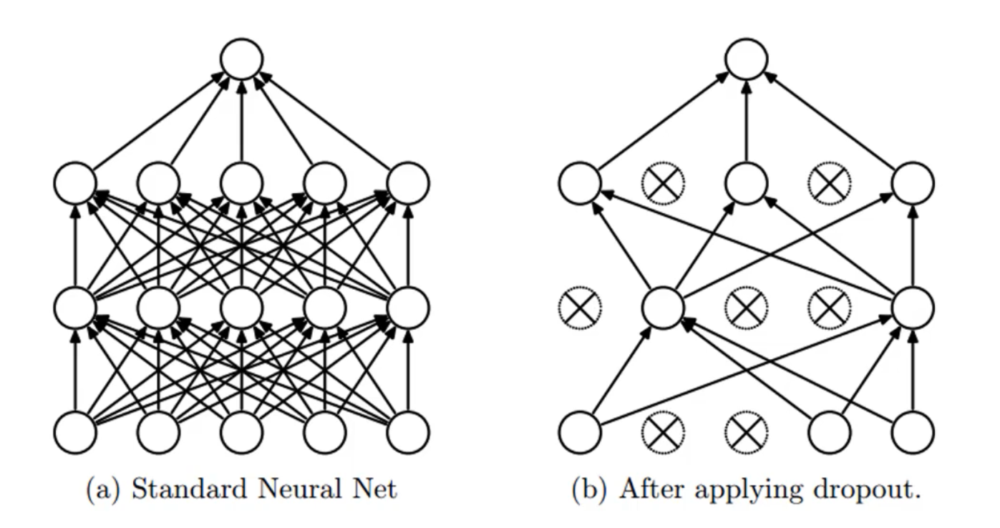

- 연산이 이루어지고 난 이후, 몇 개의 노드를 0으로 만들어준다
- 학습을 안시키는 것과 동일
- batch, epochs가 돌 때 적용
- model capacity를 줄이도록 한다

In [ ]:
class Net(nn.Module):
  def __init__(self, input_shape):
    super(Net, self).__init__()
    
    self.conv1 = nn.Conv2d(3, 32, 3)
    self.conv2 = nn.Conv2d(32, 64, 3)
    self.conv3 = nn.Conv2d(64, 128, 3)
    
    self.pool = nn.MaxPool2d(2,2)
    
    n_soze = self._get_conv_output(input_shape)
    
    self.fc1 = nn.Linear(n_size, 512)
    self.fc2 = nn.Linear(512, 10)
    
    self.dropout = nn.Dropout(0.25)
    
  def forward(self, x):
    x = self._forward_deatures(x)
    x = x.view(x.size(0), -1)
    x = self.dropout(x)
    x = F.relu(self.fc1(x))
    
    x = self.dropout(x)
    x = F.relu(self.fc2(x))
    return x

#### Dropconnect

- Weight 값을 0으로 만들어주는 것
- drop out이 구현이 더 쉬워서 더 dropout을 더 많이 사용함
- batch normalization에서는 이 모두를 없애는 것을 해본다

## Gradient Descent

Full-batch Gradient Descent
- Gradient Descent 수행시 모든 데이터를 집어넣어 gradient를 구하는 것

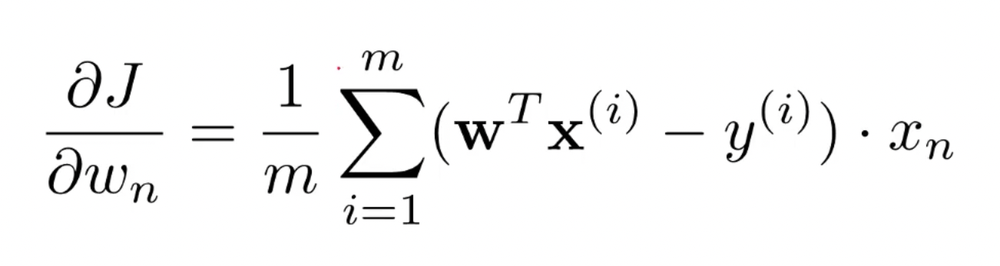

그러나 대용량의 데이터셋을 모두 구하기에는 메모리적 한계가 있다

- 업데이트 감소 가능, 계산상 효율적(속도) 가능
- 안정적인 cost 함수 수렴
- 메모리 문제
- 대규모 데이터셋에서는 모델, 파라메터 업데이트가 느려진다

#### Stochastic Gradient Descent

- 랜덤하게 뽑아낸 gradient의 평균을 구해 학습에 사용
- 원래 의미는 데이터셋에서 랜덤하게 트레이닝 샘플을 뽑은 후, 학습할 때 사용하는 것이다
- 데이터를 넣기 전에 셔플(랜덤)을 돌려 그레디언트를 구하게끔 함

- 빈번한 업데이트 모델 성능 및 개선 속도 확인 가능
- 일부 문제에 대해 더 빨리 수렴
- 지역 최적화 회피
- 대용량 데이터시 시간이 오래걸린다
  - training time을 줄이기 위해서는 SGD 보다는 다른 방식을 많이 쓴다!
- 더 이상 cost가 줄어들지 않는 시점의 발견이 어렵다
  - 언제 early stopping을 해야할지 모른다

#### Mini-batch (stocastic) gradient descent

- 한번의 일정량의 데이터를 랜덤하게 뽑아서 학습
- 가장 일반적으로 많이 쓰이는 기법
- SGD와 Batch GD를 결합한 기법

#### Epochs & Batch size

- 전체 데이터가 Training 데이터에 들어갈 때 카운팅
- n epoch : Full-batch, 모든 데이터를 n번 실행하는 것
- Batch size : 한번에 학습되는 데이터의 개수

*총 5,120개의 트레이닝 데이터에 512 배치 사이즈면 몇 번 학습을 해야 1 epoch 이 되는가? = 10 epoch

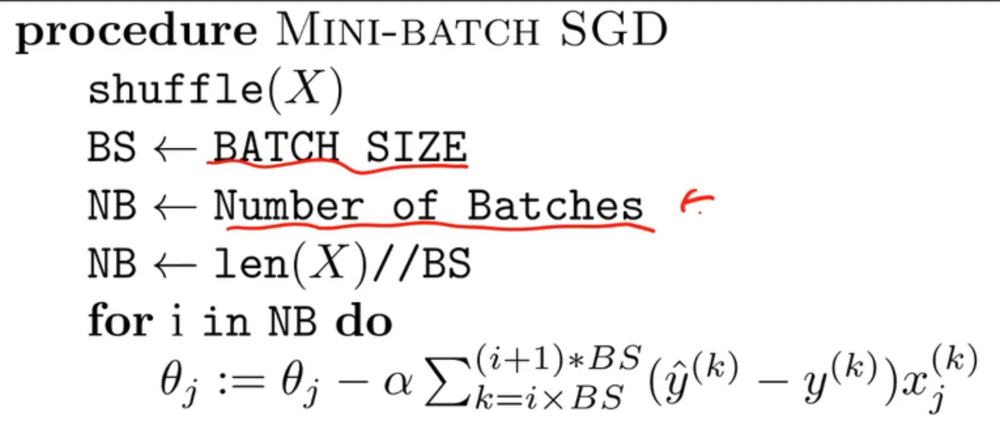

- len(X) = 5,120 // BS = 512 => 10과 같이 for루프를 돌며 업데이트가 이루어진다
- 10번 돌면 1 epoch이 올라간다

#### Optimization methods for Deep Learning
- 계산의 용이성을 위해 SGD + Minibatch를 기본으로 사용한다
- SGD로부터 다양한 Optimization 알고리즘이 파생됨
- 충분히 많은 데이터와 랜덤성만 보장된다면 local optima를 벗어날 수 있다
- 데이터의 형태가 convex를 보장한다고 가정한다
- 학습의 속도, 방향을 올릴 수 있는 방향으로 알고리즘 발전

#### Minibatch

- 데이터 크기의 증가, 메모리의 한계가 미니배치를 사용하는 큰 이유 중 하나이다
- 일반적 배치 크기는 32, 256, 16 등 2^n
  - 요즘엔 1도 사용된다
- Regularizing effect : 성능을 제한하는 효과가 발생한다

In [ ]:
import torch
from torch import optim
model = MyNetwork()
optimizer = torch.optim.SGD(model.parameters(), lt=0.01)

#### SGD

- 가장 중요한 하이퍼-파라미터는 learning rate이다
- 실제에서는 learning rate가 일정한 상수값이 아닌, 일정한 비율로 감소하는 learning rate decay를 사용한다
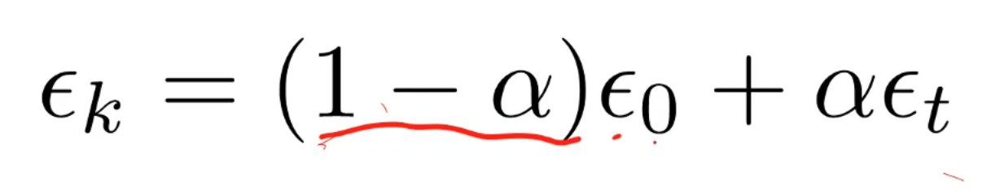

*e가 learning rate이며, a를 0.01 등 1퍼센트 정도씩 해서 점차 줄여주는 방향

#### Learning rate decay

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=1e-3)
# Adam : SGD의 후손!
scheduler = optim.lr_scheduler.LambdaLR(optimizer=optimizer,
                                        lr_lambda=lambda epoch: 0.95 ** epoch
                                        last_epoch=-1,
                                        verbose=False)
# LambdaLR : learning rate decay를 시키는 알고리즘 중 하나!

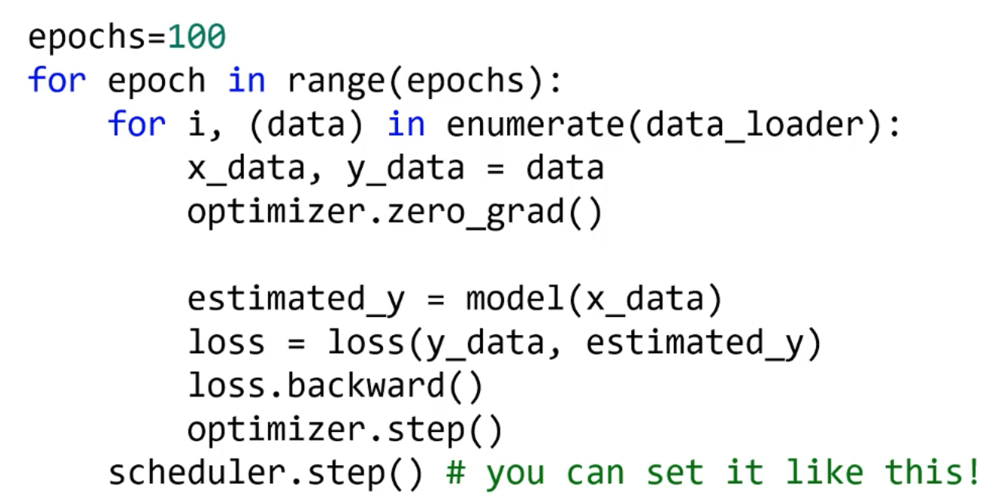

- 데이터 로더로 미니 배치가 돌아가며, 옵티마이저로 학습을 시켜준다
- 마지막으로 스케듈러를 사용하여 learning rate decay 적용

#### Exponential Learning rate decay

- Learning date를 decay 시키는 방법 중 하나

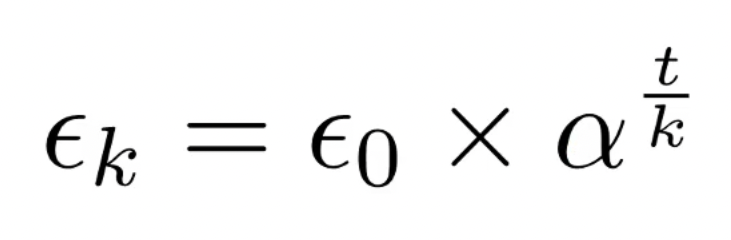

- 전체 스탭 t, decay steps k번마다 감소되도록 한다
  - 총 10번을 돈다고 하면, 5번에 한번씩 감소와 같이
- 해당 값을 decay rate 비율인 a의 지수로 올려 처음엔 크게 감소했다가 이후 작게 감소되도록 함
  - a^(10/5)

## momentum

#### families of SGD

- SGD를 보완하는 방법 2가지, Step direction, step size
  - step size : 한번에 이동하는 양
  - Step direction : 이동하는 방향

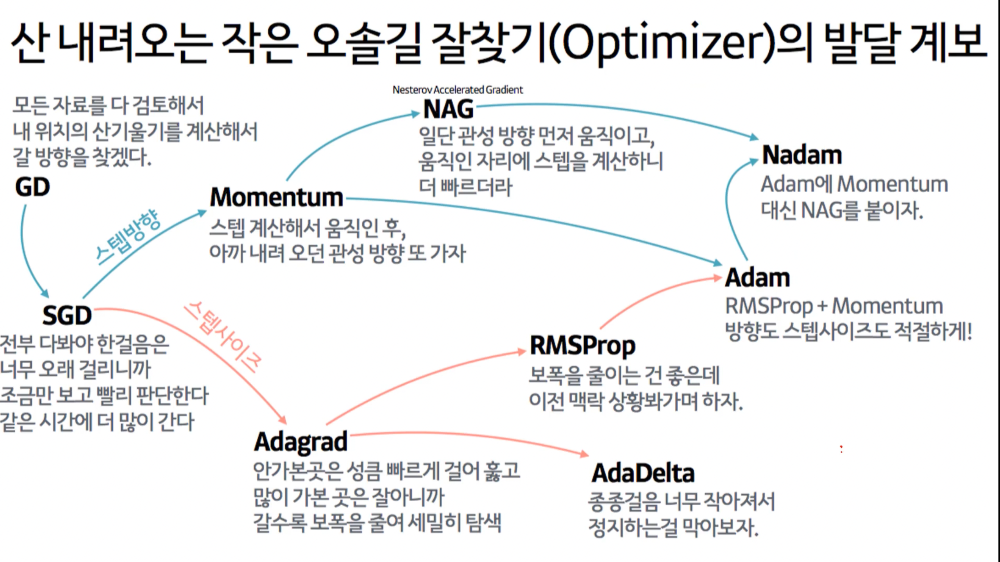

#### momentum

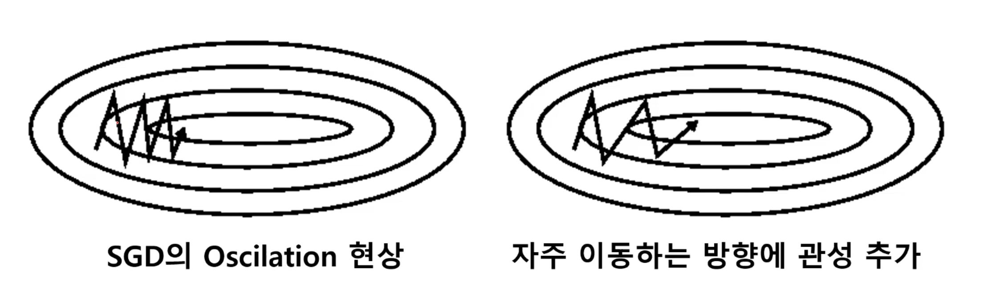

최적값이 가운데에 있다고 가정할 때, 이를 향해 이동하면서 지그재그로 움직이게 됨
- 이를 관성을 추가하여 좀 더 빨리 도달하도록 함

- Gradient Descent를 통해 이동하는 과정에 일종의 관성을 추가함
- 과거에 이동했던 방식을 기억하여 해당 방향으로 추가 이동

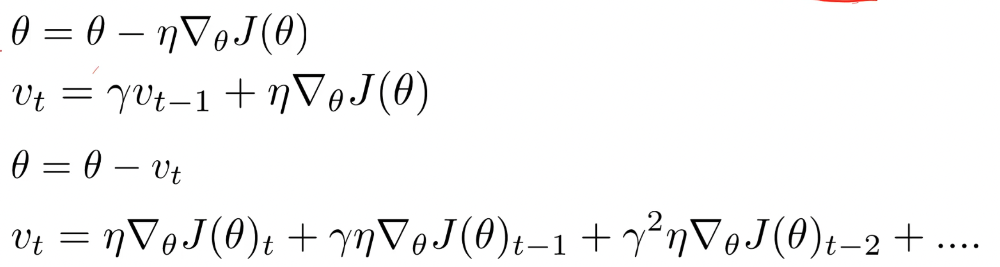

가중치를 업데이트할 때, 미분값을 vt라고 이전에 갔던 값을 감마만큼 곱한 값을 현재 가중치의 미분값을 더해준다
- 즉, 이전 방향성을 가지고 있다 = 과거의 방향을 감마만큼 기억하고 있다

- SGD에 비해 빠르게 수렴
- local optima를 빠져나올 수 있음
- 과도한 메모리 사용

## NAG (Nesterov Accelerated Gradient)

Momentum을 기초로 한 방식, Gradient 계산 방식 상이

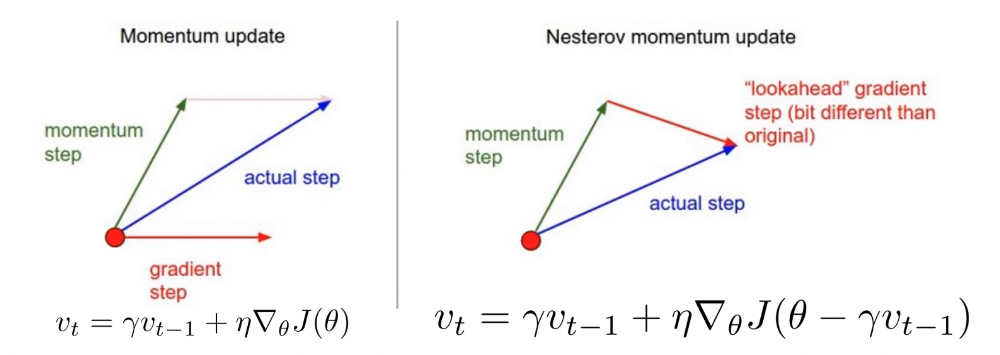

기존 momentim : 이전 vt가 들어간 후, learning rate에는 현재의 세타값 gradient를 곱해주는 방식
- momenutm step (이전에 갔던 방향)과 gradient (현재 방향)을 어느정도 절충하여 중간 방향으로 간다면
- 현재 위치에서의 gradient와 Momentum step을 독립적으로 계싼

NAG : 이전 vt가 들어간 후, 미분값에도 같이 반영하게 됨
- momenutm step (이전에 갔던 방향)과 lookahead gradient (현재 방향) 이전에 갔던 방향에서 시작하여 실제 (actual step)이 나오게 됨
- Momentum 스텝을 먼저 고려
  - Momentum 스텝을 먼저 이동했다고 생각한 후, 그 자리에서의 gradient를 구해 gradient step으로 이동하게 됨
  - 즉, weight값을 미리 업데이트를 시킨 후, gradient를 구해 gradient step으로 이동하게 됨

- Momentum 방식의 경우 멈춰야 할 시점에서도 관성에 의해 훨씬 멀리 가는 단점
- NAG 방식의 경우 일단 모멘텀으로 이동을 반정도 한 후, 어떤 방식으로 이동해야 할지를 결정
- 따라서 모멘텀 방식의 빠른 이동에 대한 이점은 누리면서도 멈춰야 할 시점에 멈춤!

## adagrad

#### Adaptive Gradient (adagrad)

- 개별 가중치 파라미터 별로 adaptive하게 러닝 레이트를 조절하는 기법
- 지금까지 많이 변화하지 않은 변수들은 step size를 크게, 지금까지 많이 변화했던 변수들은 작게
- 많이 변화한 거는 어떻게 측정하나?

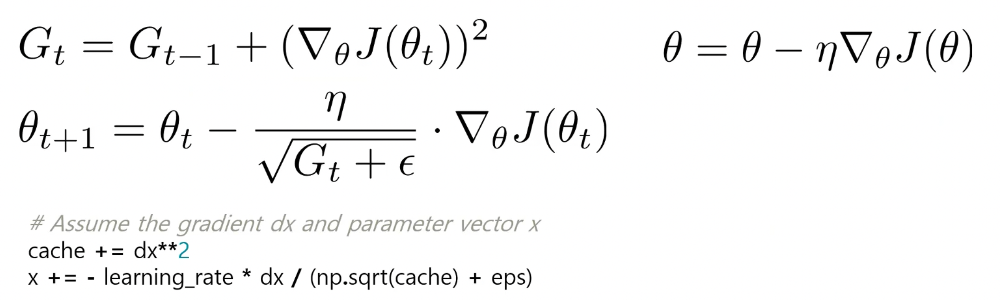

GT : 2차원 벡터로, time step t까지의 각 변수가 이동한 gradient의 sum of squares를 저장함
- 세타를 업데이트하는 상황에서는 기존 러닝 레이트에 GT 루트값에 반비례한 크기로 이동을 진행하게 됨
  - 지금까지 많이 변화한 변수일수록 적게 이동하게 될 것이며, 적게 변화한 변수일수록 많이 이동하게 될 것
- 여기서 엡실론을 더해주어 0으로 나누는 것을 방지 *엡실론 : 0과 가까운 매우 작은 값

- 수동으로 학습 속도를 조정할 필요가 없다
- 대부분의 구현에서는 기본값인 0.01을 사용한다
- 큰 약점은 분모에 제곱된 기울기가 축적이 된다
  - 추가된 값은 양수 -> 누적 합계가 계속 증가 -> 학습 속도 감소 -> 궁극적으로 급히 작아짐 -> 학습 종료